In [1]:
import anndata as ad
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

from scipy.stats import pearsonr
from scipy.stats import spearmanr
from scipy.stats import stats
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list, fcluster

import seaborn as sns
import gseapy as gp
import matplotlib.colors as mcolors

In [15]:
fdata = ad.read_h5ad("./RNA/Multitime_sorted.h5")
cdata = ad.read_h5ad("./RNA/Multitime.fixed.guide.h5")

In [202]:
bin_with_high_guide_cnt = {}
for guide in cdata.var_names:
    bin_with_high_guide_cnt[guide] = (cdata[:, guide].X.toarray() > 3)

In [203]:
corr_df = {}
expr_matrix = fdata.X.toarray()
for ig, guide in tqdm(enumerate(cdata.var_names)):
    expr_matrix = fdata[bin_with_high_guide_cnt[guide], :].X.toarray()
    guide_vec = cdata[bin_with_high_guide_cnt[guide], guide].X.toarray()
    corr_df[guide] = []
    for idx, gene in enumerate(fdata.var_names):
        corr_df[guide].append(spearmanr(guide_vec, expr_matrix[:, idx])[0])

0it [00:00, ?it/s]/tmp/ipykernel_4212/1066347724.py:8: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr_df[guide].append(spearmanr(guide_vec, expr_matrix[:, idx])[0])
34it [08:13, 14.51s/it]


In [204]:
spearman_df = pd.DataFrame(corr_df, index=fdata.var_names)
spearman_df = spearman_df.dropna()
spearman_df

,sgAdrb2,sgAqp3,sgArntl,sgCd44,sgCd52,sgCxcl16,sgDdit3,sgErgic2,sgFbxo7,sgFlot1,...,sgScamp4,sgSlc39a8,sgSorl1,sgSrgn,sgTmem64,sgWipf1,sgZc3h12a,sgZhx2,sgZscan12,sgnon-targeting
A2m,-0.078586,-0.061749,-0.080349,-0.002587,-0.143667,-0.029511,-0.051968,-0.080960,0.033493,-0.048747,...,-0.097144,-0.043522,-0.059746,-0.006175,-0.065191,-0.072822,-0.016164,-0.045027,-0.024419,-0.036154
A4galt,0.051002,-0.043245,0.004785,0.041236,0.058307,0.012639,0.026156,0.028746,0.029764,0.021602,...,0.057741,0.013850,0.013931,-0.055107,-0.008999,0.034056,0.037960,-0.004864,-0.048669,0.006027
AA467197,-0.036805,-0.031019,-0.053156,-0.065820,-0.073312,0.019129,-0.021820,0.001265,-0.010856,-0.025040,...,-0.048664,0.050677,-0.053940,-0.019821,-0.058947,-0.024702,0.005587,-0.037564,0.002760,-0.072186
AA543186,0.023748,-0.012831,0.027905,-0.006091,-0.005781,-0.028152,0.011801,-0.011289,0.050086,0.031055,...,-0.029269,-0.070820,-0.023673,0.070140,-0.011357,0.033163,0.002504,-0.016593,0.018015,-0.019891
AA986860,-0.038428,-0.011990,0.005384,-0.019864,0.003862,-0.008282,0.003456,-0.009027,-0.022517,0.077549,...,0.031505,0.020792,0.016906,0.064465,0.062086,-0.019484,-0.001256,-0.003713,-0.005455,0.045671
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zxdc,0.027592,0.023752,-0.009923,0.003834,0.010828,-0.024717,-0.002483,0.047599,0.005771,0.054396,...,-0.056298,0.080165,0.019101,-0.001804,0.031468,0.044433,0.023566,0.045301,0.019014,0.008209
Zyg11b,0.011437,-0.008778,0.018022,0.044799,0.054452,-0.004299,0.021554,0.018514,0.026921,-0.002409,...,0.036483,0.040743,0.067003,0.021942,-0.004113,0.030420,-0.014459,0.040417,0.021094,0.019406
Zyx,0.022383,-0.023969,-0.024974,0.013294,-0.037521,0.063202,-0.007883,0.014409,0.006897,0.058016,...,-0.013948,0.074491,0.044929,0.012582,-0.004610,-0.005624,0.050329,0.000412,0.008555,-0.001041
Zzz3,-0.024634,0.015996,-0.073568,0.014538,-0.034886,-0.031429,-0.044035,0.011474,0.019969,-0.023663,...,0.004350,0.037858,0.003542,-0.024166,-0.000791,-0.001015,-0.003584,0.002168,-0.004456,-0.026458


In [205]:
high_correlated_gene = []
low_correlated_gene = []
for i in range(34):
    guide_vec = spearman_df.iloc[:, i]
    mu = np.mean(guide_vec)
    std = np.std(guide_vec)
    z = (guide_vec - mu) / std

    high_correlated = (z > np.quantile(z, 0.9999))
    low_correlated = (z < np.quantile(z, 0.0001))
    high_correlated_gene += (spearman_df.index[high_correlated].tolist())
    low_correlated_gene += (spearman_df.index[low_correlated].tolist())
high_correlated_gene = set(high_correlated_gene)
low_correlated_gene = set(low_correlated_gene)
print("high:", len(high_correlated_gene), ", low:", len(low_correlated_gene))

high: 52 , low: 53


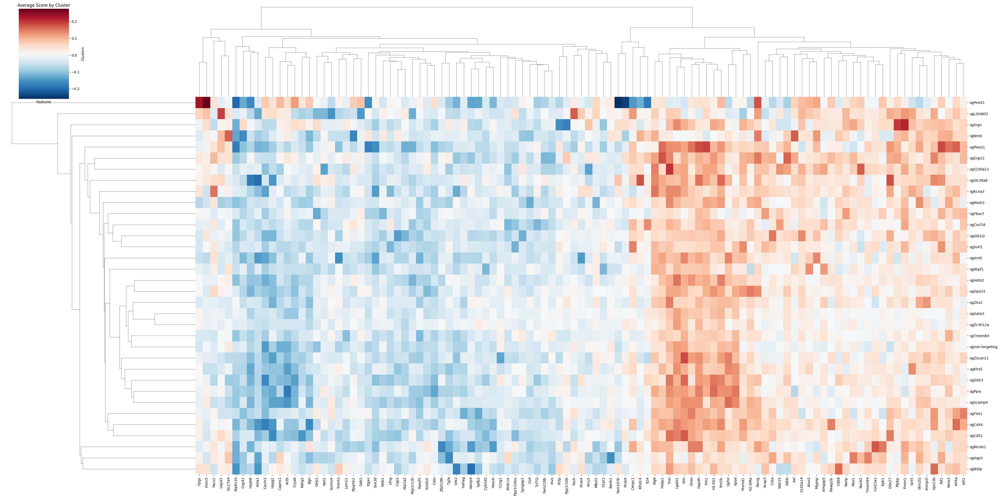

In [206]:
interest_gene = list(high_correlated_gene.union(low_correlated_gene))

g = sns.clustermap(spearman_df.loc[interest_gene, :].T, annot=False, fmt="", cmap="RdBu_r", figsize=(40, 20))

plt.title('Average Score by Cluster')
plt.xlabel('Features')
plt.ylabel('Clusters')
plt.show()

# sgPomt1

In [207]:
guide_vec = spearman_df.loc[:, "sgPomt1"]
ntc_vec = spearman_df.loc[:, "sgnon-targeting"]
mu = np.mean(guide_vec)
mu_ = np.mean(ntc_vec)
std = np.std(guide_vec)
std_ = np.std(ntc_vec)
z = (guide_vec - mu) / std
z_ = (ntc_vec - mu) / std

In [209]:
high_genes = spearman_df.index[(z > (np.quantile(z, 0.9)))].tolist()
#low_genes = spearman_df.index[(z < (np.quantile(z, 0.1))) & (z_ > (np.quantile(z_, 0.1)))].tolist()

data = {
    'Gene': high_genes,# + low_genes,
    'Cluster': ['high'] * len(high_genes)# + ['low'] * len(low_genes)
}
dev_df = pd.DataFrame(data)
dev_df.to_csv('DEG.csv', index=False, sep="\t")
dev_df

,Gene,Cluster
0,AC110211.1,high
1,AC117662.4,high
2,AC118475.1,high
3,AC125199.4,high
4,AC140300.3,high
...,...,...
1123,Zrsr2,high
1124,Zscan12,high
1125,Zscan18,high
1126,Zscan2,high


In [210]:
!sshpass -p wang2024 ssh wpy@172.16.10.103 "mamba run -n gsea python ~/stereoseq/20240502-SPACseq/enrich.py"

Gene       object
Cluster    object
dtype: object
/home/wpy/stereoseq/20240502-SPACseq/bin/go-basic.obo: fmt(1.2) rel(2024-04-24) 45,667 Terms
Enrichment analysis for list 0 completed successfully: 721



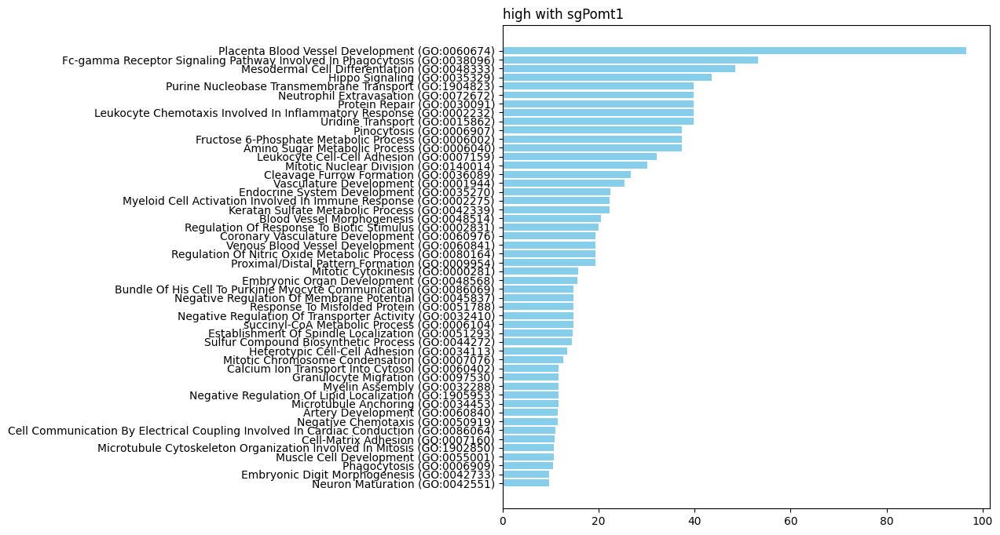

In [211]:
clusters = np.unique(dev_df["Cluster"])
n_clusters = len(clusters)
fig = plt.figure(figsize=(8, n_clusters * 8))
for i in range(n_clusters):
    ax = plt.subplot(n_clusters, 1, i+1)
    plt.title(f"{clusters[i]}" + " with sgPomt1", loc="left")
    if i == 2: continue
    enr = pd.read_csv(f"./GO/Cluster_{i}.result", sep="\t")
    results = enr.sort_values(by='Combined Score', ascending=False).head(50)

    ax.barh(results['Term'], results['Combined Score'], color='skyblue')

    plt.gca().invert_yaxis()

In [212]:
for i in range(1):
    enr = pd.read_csv(f"./GO/Cluster_{i}.result", sep="\t")
    results = enr.sort_values(by='Combined Score', ascending=False)
    results = results[results["Combined Score"] >20]
    results[["Name", "ID"]] = results["Term"].str.extract(r'(.+?) \((GO:\d+)\)')
    results = results.iloc[:, [-1, -2, -3, -4]]
    results["Cluster"] = i
    if not i: go_df = results
    else: go_df = pd.concat([go_df, results], axis=0)
go_df

,ID,Name,Genes,Combined Score,Cluster
5,GO:0060674,Placenta Blood Vessel Development,ITGB8;PKD2;RBPJ,96.636118,0
0,GO:0038096,Fc-gamma Receptor Signaling Pathway Involved I...,FGR;PAK1;SYK;PRKCE;LIMK1;FCGR2B,53.191944,0
10,GO:0048333,Mesodermal Cell Differentiation,ITGB3;ITGA8;HMGA2,48.473512,0
3,GO:0035329,Hippo Signaling,TEAD4;LATS2;TEAD1;TEAD2;STK3,43.560987,0
30,GO:1904823,Purine Nucleobase Transmembrane Transport,SLC29A3;SLC28A3,39.805244,0
28,GO:0072672,Neutrophil Extravasation,JAML;PECAM1,39.805244,0
29,GO:0030091,Protein Repair,MSRB3;MSRB1,39.805244,0
27,GO:0002232,Leukocyte Chemotaxis Involved In Inflammatory ...,MDK;NINJ1,39.805244,0
31,GO:0015862,Uridine Transport,SLC29A3;SLC28A3,39.805244,0
16,GO:0006907,Pinocytosis,RAB34;SNX33;DOCK2,37.348676,0


In [60]:
def gene_mouse(str_):
    return [t[0] + t[1:].lower() for t in str_]

In [108]:
go_df["Name"][4]

'Positive Regulation Of Cell Migration Involved In Sprouting Angiogenesis'

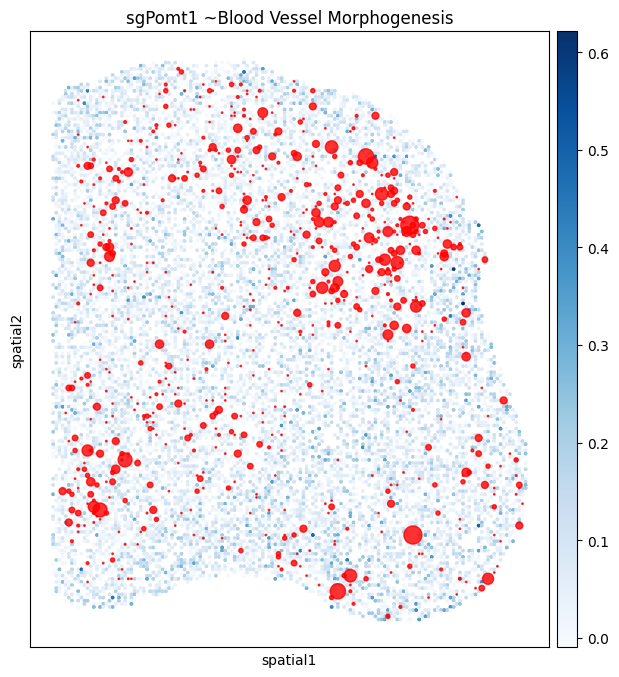

In [221]:
GO_="Blood Vessel Morphogenesis"
time_point = "2"
genes = go_df[go_df["Name"] == GO_]["Genes"].str.split(';').apply(gene_mouse).tolist()[0]
sc.tl.score_genes(fdata, genes + ["Yap1"], score_name="score")

fig, ax = plt.subplots(figsize=(10, 8))
sq.pl.spatial_scatter(fdata[(fdata.obs["time_point"] == time_point) & (fdata.obs["score"] > fdata.obs["score"].mean())], \
     color="score", shape=None, size=10, library_id="spatial", ax=ax, cmap="Blues")

x = cdata[cdata.obs["time_point"] == time_point].obsm["spatial"][:, 0]
y = cdata[cdata.obs["time_point"] == time_point].obsm["spatial"][:, 1]
a = (cdata[cdata.obs["time_point"] == time_point,"sgPomt1"].X.flatten()).tolist()

ax.scatter(x, y, s=np.square(a), alpha=0.8, color="#FF0000")
ax.set_title("sgPomt1 ~" + GO_)
plt.show()

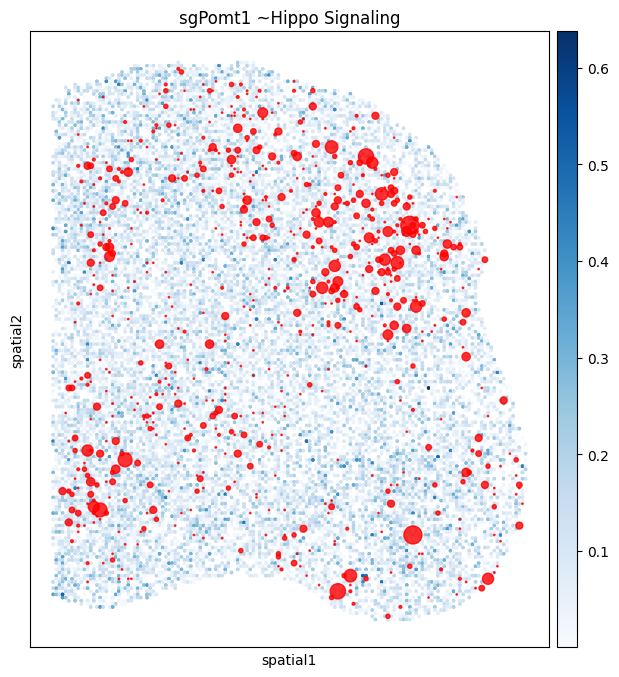

In [174]:
GO_="Hippo Signaling"
time_point = "2"
genes = go_df[go_df["Name"] == GO_]["Genes"].str.split(';').apply(gene_mouse).tolist()[0]
sc.tl.score_genes(fdata, genes, score_name="score")

fig, ax = plt.subplots(figsize=(10, 8))
sq.pl.spatial_scatter(fdata[(fdata.obs["time_point"] == time_point) & (fdata.obs["score"] > 0)], \
     color="score", shape=None, size=10, library_id="spatial", ax=ax, cmap="Blues")

x = cdata[cdata.obs["time_point"] == time_point].obsm["spatial"][:, 0]
y = cdata[cdata.obs["time_point"] == time_point].obsm["spatial"][:, 1]
a = (cdata[cdata.obs["time_point"] == time_point,"sgPomt1"].X.flatten()).tolist()

ax.scatter(x, y, s=np.square(a), alpha=0.8, color="#FF0000")
ax.set_title("sgPomt1 ~" + GO_)
plt.show()

In [293]:
Fibroblasts = ["Col1a1", "Col1a2", "Col3a1","Mmp2", "Myl9", "Dcn","Fap"]
Tex = ['Havcr2', 'Lag3', 'Pdcd1', 'Entpd1', 'Tigit', 'Ctla4', 'Layn']
Macrophages = ["Ptprc", "Cd14", "Itgam", "Itgax", "Trem2", "Fcgr3a", "Fcgr3b", "Ccr2", "Cd163", "Cd68", "Arg1", "Adgre1", "Cd33", "Cd68", "C1qa", "Cd163",  "C1qb", "C1qc",  "Marco", "Cd81"]
DC = ["Ptprc", "Itgam", "Itgax", "Cd14", "Cd33", "Cd68", "Cd1c", "Cd209", "Ccl22", "Cd86", "Clec9a", "Clec10a", "Xcr1", "Lamp3"]
Endothelial = ["Vwf", "Pecam1", "Cldn5","Cdh5", "Mgp"]

Blood_vessel = pd.read_csv("./GO/Mechanical_stimulus.txt", header=None)[0].tolist()
sc.tl.score_genes(fdata, ["Col1a1", "Col1a2"], score_name="score")

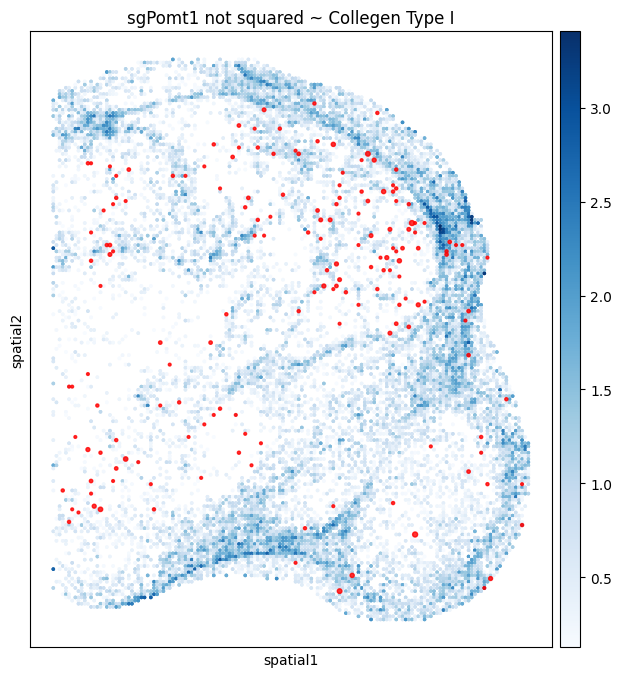

In [298]:
fig, ax = plt.subplots(figsize=(10, 8))
guide = "sgPomt1"
time_point = "2"
sq.pl.spatial_scatter(fdata[(fdata.obs["time_point"] == time_point) & (fdata.obs["score"] > fdata.obs["score"].mean())], \
     color="score", shape=None, size=10, library_id="spatial", ax=ax, cmap="Blues")

x = cdata[bin_with_high_guide_cnt[guide]][cdata[bin_with_high_guide_cnt[guide]].obs["time_point"] == time_point].obsm["spatial"][:, 0]
y = cdata[bin_with_high_guide_cnt[guide]][cdata[bin_with_high_guide_cnt[guide]].obs["time_point"] == time_point].obsm["spatial"][:, 1]
a = (cdata[bin_with_high_guide_cnt[guide]][cdata[bin_with_high_guide_cnt[guide]].obs["time_point"] == time_point,guide].X.flatten()).tolist()

ax.scatter(x, y, s=a, alpha=0.8, color="#FF0000")
ax.set_title(f"{guide} not squared ~ " + "Collegen Type I")
plt.show()

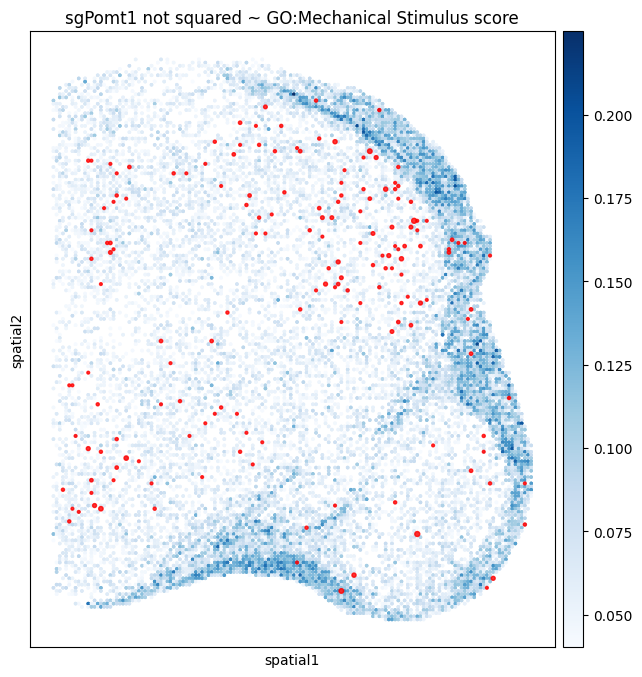

In [252]:
fig, ax = plt.subplots(figsize=(10, 8))
guide = "sgPomt1"
time_point = "2"
sq.pl.spatial_scatter(fdata[(fdata.obs["time_point"] == time_point) & (fdata.obs["score"] > fdata.obs["score"].mean())], \
     color="score", shape=None, size=10, library_id="spatial", ax=ax, cmap="Blues")

x = cdata[bin_with_high_guide_cnt[guide]][cdata[bin_with_high_guide_cnt[guide]].obs["time_point"] == time_point].obsm["spatial"][:, 0]
y = cdata[bin_with_high_guide_cnt[guide]][cdata[bin_with_high_guide_cnt[guide]].obs["time_point"] == time_point].obsm["spatial"][:, 1]
a = (cdata[bin_with_high_guide_cnt[guide]][cdata[bin_with_high_guide_cnt[guide]].obs["time_point"] == time_point,guide].X.flatten()).tolist()

ax.scatter(x, y, s=a, alpha=0.8, color="#FF0000")
ax.set_title(f"{guide} not squared ~ " + "GO:Mechanical Stimulus score")
plt.show()

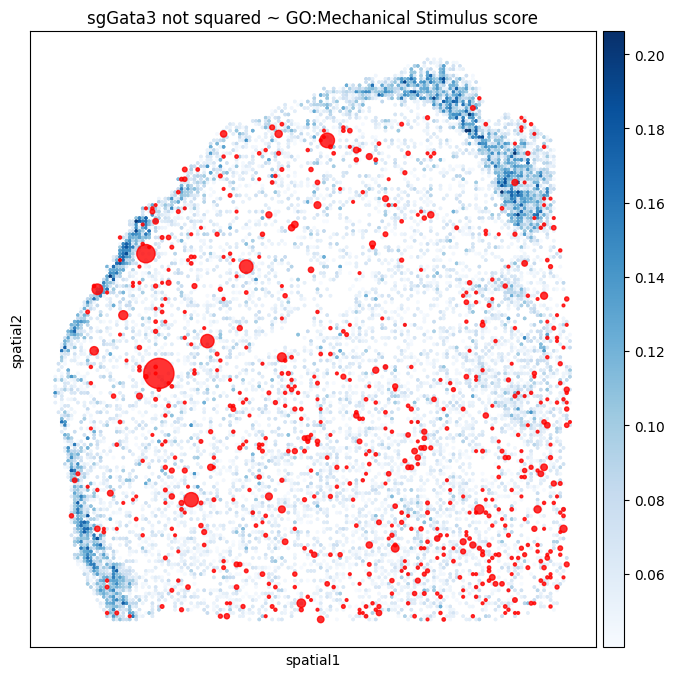

In [256]:
fig, ax = plt.subplots(figsize=(10, 8))
guide = "sgGata3"
time_point = "3"
sq.pl.spatial_scatter(fdata[(fdata.obs["time_point"] == time_point) & (fdata.obs["score"] > fdata.obs["score"].mean())], \
     color="score", shape=None, size=10, library_id="spatial", ax=ax, cmap="Blues")

x = cdata[bin_with_high_guide_cnt[guide]][cdata[bin_with_high_guide_cnt[guide]].obs["time_point"] == time_point].obsm["spatial"][:, 0]
y = cdata[bin_with_high_guide_cnt[guide]][cdata[bin_with_high_guide_cnt[guide]].obs["time_point"] == time_point].obsm["spatial"][:, 1]
a = (cdata[bin_with_high_guide_cnt[guide]][cdata[bin_with_high_guide_cnt[guide]].obs["time_point"] == time_point,guide].X.flatten()).tolist()

ax.scatter(x, y, s=a, alpha=0.8, color="#FF0000")
ax.set_title(f"{guide} not squared ~ " + "GO:Mechanical Stimulus score")
plt.show()

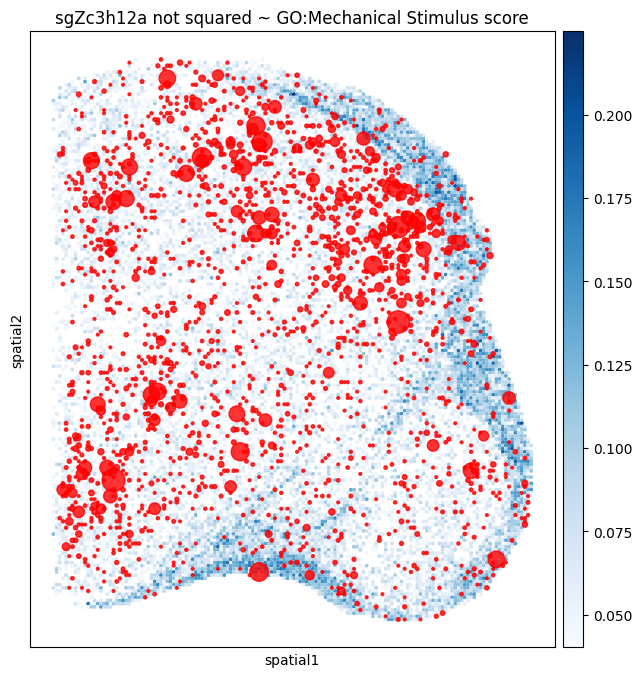

In [254]:
fig, ax = plt.subplots(figsize=(10, 8))
guide = "sgZc3h12a"
time_point = "2"
sq.pl.spatial_scatter(fdata[(fdata.obs["time_point"] == time_point) & (fdata.obs["score"] > fdata.obs["score"].mean())], \
     color="score", shape=None, size=10, library_id="spatial", ax=ax, cmap="Blues")

x = cdata[bin_with_high_guide_cnt[guide]][cdata[bin_with_high_guide_cnt[guide]].obs["time_point"] == time_point].obsm["spatial"][:, 0]
y = cdata[bin_with_high_guide_cnt[guide]][cdata[bin_with_high_guide_cnt[guide]].obs["time_point"] == time_point].obsm["spatial"][:, 1]
a = (cdata[bin_with_high_guide_cnt[guide]][cdata[bin_with_high_guide_cnt[guide]].obs["time_point"] == time_point,guide].X.flatten()).tolist()

ax.scatter(x, y, s=a, alpha=0.8, color="#FF0000")
ax.set_title(f"{guide} not squared ~ " + "GO:Mechanical Stimulus score")
plt.show()

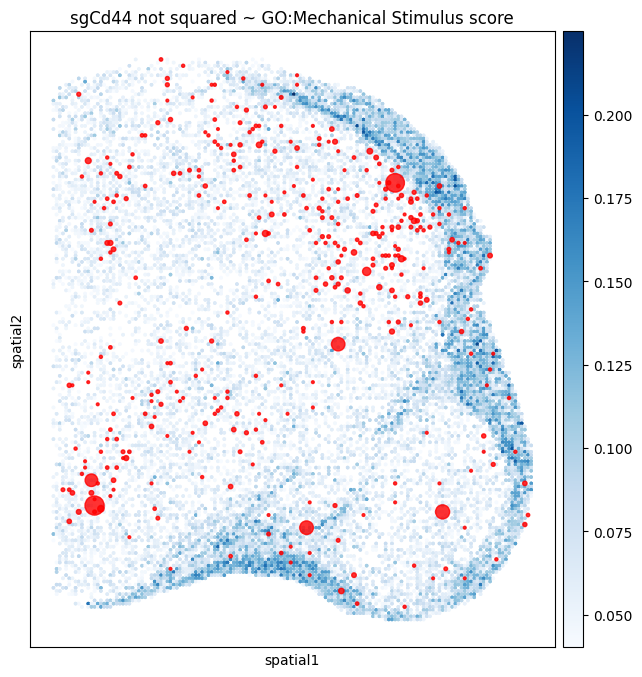

In [255]:
fig, ax = plt.subplots(figsize=(10, 8))
guide = "sgCd44"
time_point = "2"
sq.pl.spatial_scatter(fdata[(fdata.obs["time_point"] == time_point) & (fdata.obs["score"] > fdata.obs["score"].mean())], \
     color="score", shape=None, size=10, library_id="spatial", ax=ax, cmap="Blues")

x = cdata[bin_with_high_guide_cnt[guide]][cdata[bin_with_high_guide_cnt[guide]].obs["time_point"] == time_point].obsm["spatial"][:, 0]
y = cdata[bin_with_high_guide_cnt[guide]][cdata[bin_with_high_guide_cnt[guide]].obs["time_point"] == time_point].obsm["spatial"][:, 1]
a = (cdata[bin_with_high_guide_cnt[guide]][cdata[bin_with_high_guide_cnt[guide]].obs["time_point"] == time_point,guide].X.flatten()).tolist()

ax.scatter(x, y, s=a, alpha=0.8, color="#FF0000")
ax.set_title(f"{guide} not squared ~ " + "GO:Mechanical Stimulus score")
plt.show()

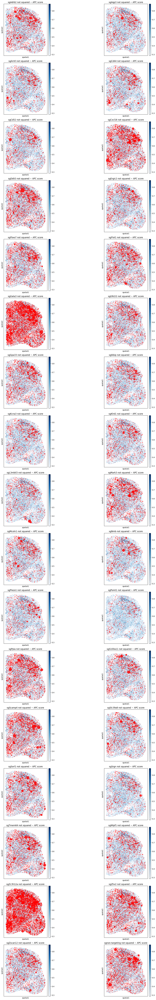

In [274]:
fig, ax = plt.subplots(17, 2, figsize=(20, 80))
time_point = "2"
cnt = 0
for guide in cdata.var_names:
    ix = cnt // 2
    iy = cnt % 2
    current_ax = ax[ix, iy]
    sq.pl.spatial_scatter(fdata[(fdata.obs["time_point"] == time_point) & (fdata.obs["score"] > fdata.obs["score"].mean())], \
        color="score", shape=None, size=10, library_id="spatial", ax=current_ax, cmap="Blues")

    x = cdata[cdata.obs["time_point"] == time_point].obsm["spatial"][:, 0]
    y = cdata[cdata.obs["time_point"] == time_point].obsm["spatial"][:, 1]
    a = (cdata[cdata.obs["time_point"] == time_point,guide].X.flatten()).tolist()

    current_ax.scatter(x, y, s=a, alpha=0.8, color="#FF0000")
    current_ax.set_title(f"{guide} not squared ~ " + "APC score")
    cnt += 1
plt.tight_layout()
plt.show()